In [1]:
import numpy as np
import pandas as pd
import cv2
from PIL import Image
import scipy

import tensorflow as tf 

In [2]:
from tensorflow.keras.applications import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.losses import *
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.preprocessing.image import *
from tensorflow.keras.utils import *

In [3]:
from sklearn.metrics import *
from sklearn.model_selection import *
import tensorflow.keras.backend as K

In [4]:
from tqdm import tqdm, tqdm_notebook
from colorama import Fore
import json
import matplotlib.pyplot as plt
import seaborn as snss
from glob import glob
from skimage.io import *
%config Completer.use_jedi = False
import time
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import xgboost as xgb
import numpy as np 
from tqdm import tqdm
import cv2
import os
import shutil
import itertools
import imutils
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16, preprocess_input
from keras import layers
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping

init_notebook_mode(connected=True)
RANDOM_SEED = 123

print("Semua Modul Berhasil di Import")

Semua Modul Berhasil di Import


In [ ]:
# create new folders
!mkdir TRAIN TEST VAL TRAIN/YES TRAIN/NO TEST/YES TEST/NO VAL/YES VAL/NO


In [6]:
IMG_PATH = "/Users/macbookair/Documents/TUGAS AKHIR/CUSTOM/DATASET"

# split the data by train/val/test
ignored = {"pred"}
# split the data by train/val/test
for CLASS in os.listdir(IMG_PATH):
    if CLASS not in ignored:
        if not CLASS.startswith('.'):
            IMG_NUM = len(os.listdir(IMG_PATH +"/"+ CLASS))
            for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH +"/"+ CLASS)):
                img = IMG_PATH+ '/' +  CLASS + '/' + FILE_NAME
                if n < 300:
                    shutil.copy(img, 'TEST/' + CLASS.upper() + '/' + FILE_NAME)
                elif n < 0.8*IMG_NUM:
                    shutil.copy(img, 'TRAIN/'+ CLASS.upper() + '/' + FILE_NAME)
                else:
                    shutil.copy(img, 'VAL/'+ CLASS.upper() + '/' + FILE_NAME)

In [7]:
def load_data(dir_path, img_size=(100,100)):
    """
    Load resized images as np.arrays to workspace
    """
    X = []
    y = []
    i = 0
    labels = dict()
    for path in tqdm(sorted(os.listdir(dir_path))):
        if not path.startswith('.'):
            labels[i] = path
            for file in os.listdir(dir_path + path):
                if not file.startswith('.'):
                    img = cv2.imread(dir_path + path + '/' + file)
                    X.append(img)
                    y.append(i)
            i += 1
    X = np.array(X)
    y = np.array(y)
    print(f'{len(X)} images loaded from {dir_path} directory.')
    return X, y, labels

In [8]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [9]:
TRAIN_DIR = 'TRAIN/'
TEST_DIR = 'TEST/'
VAL_DIR = 'VAL/'
IMG_SIZE = (224,224)

In [10]:
X_train, y_train, labels = load_data(TRAIN_DIR, IMG_SIZE)
X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)

100%|██████████| 2/2 [00:05<00:00,  2.64s/it]
/var/folders/ks/sfvwnhvj429_0mlztjrg16bh0000gn/T/ipykernel_1214/2849700839.py:18: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



1800 images loaded from TRAIN/ directory.


100%|██████████| 2/2 [00:01<00:00,  1.50it/s]


600 images loaded from TEST/ directory.


100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

600 images loaded from VAL/ directory.


In [11]:
y = dict()
y[0] = []
y[1] = []
for set_name in (y_train, y_val, y_test):
    y[0].append(np.sum(set_name == 0))
    y[1].append(np.sum(set_name == 1))

trace0 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[0],
    name='No',
    marker=dict(color='#33cc33'),
    opacity=0.7
)
trace1 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[1],
    name='Yes',
    marker=dict(color='#ff3300'),
    opacity=0.7
)
data = [trace0, trace1]
layout = go.Layout(
    title='Jumlah Kelas Pada Setiap Set',
    xaxis={'title': 'Set'},
    yaxis={'title': 'Count'}
)
fig = go.Figure(data, layout)
iplot(fig)

In [12]:
def plot_samples(X, y, labels_dict, n=50):
    """
    Creates a gridplot for desired number of images (n) from the specified set
    """
    for index in range(len(labels_dict)):
        imgs = X[np.argwhere(y == index)][:n]
        j = 10
        i = int(n/j)

        plt.figure(figsize=(15,6))
        c = 1
        for img in imgs:
            plt.subplot(i,j,c)
            plt.imshow(img[0])

            plt.xticks([])
            plt.yticks([])
            c += 1
        plt.suptitle('Tumor: {}'.format(labels_dict[index]))
        plt.show()

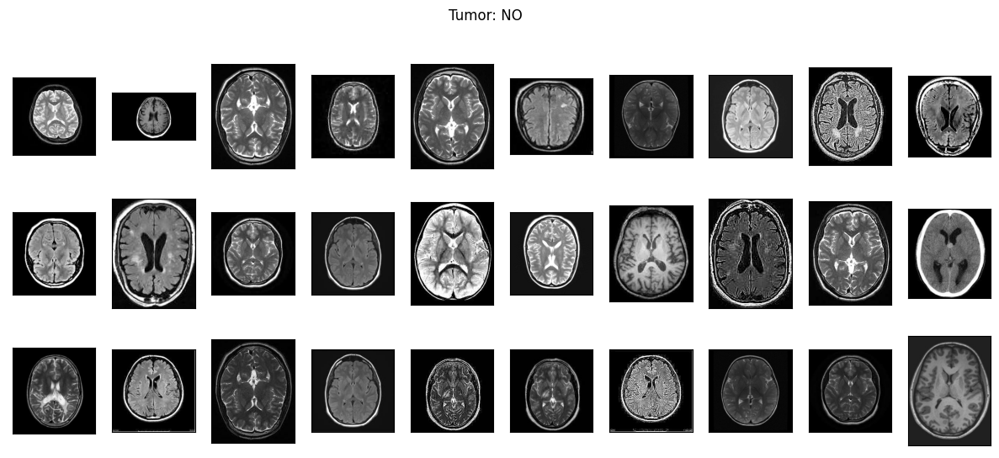

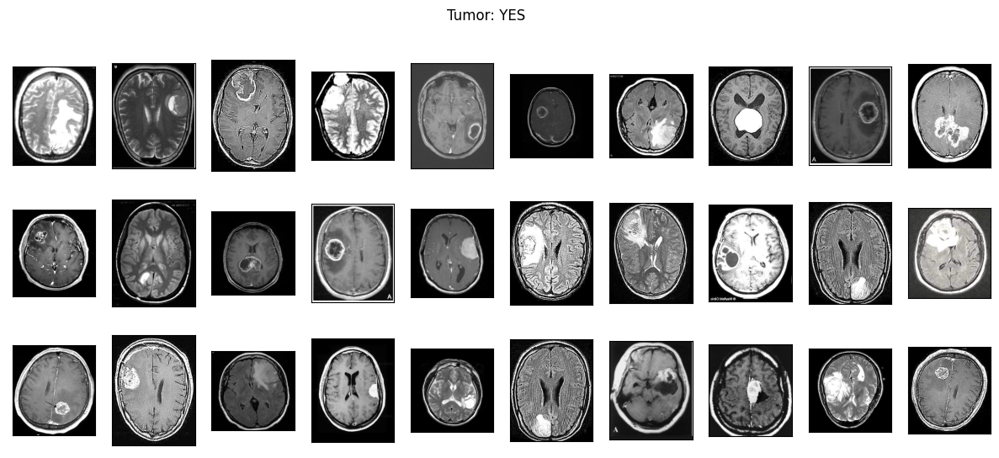

In [13]:
plot_samples(X_train, y_train, labels, 30)

In [14]:
def crop_imgs(set_name, add_pixels_value=0):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    set_new = []
    for img in set_name:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # threshold the image, then perform a series of erosions +
        # dilations to remove any small regions of noise
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # find contours in thresholded image, then grab the largest one
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        # find the extreme points
        extLeft = tuple(c[c[:, :, 0].argmin()][0])
        extRight = tuple(c[c[:, :, 0].argmax()][0])
        extTop = tuple(c[c[:, :, 1].argmin()][0])
        extBot = tuple(c[c[:, :, 1].argmax()][0])

        ADD_PIXELS = add_pixels_value
        new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
        set_new.append(new_img)

    return np.array(set_new)

In [15]:
import imutils
img = cv2.imread('/Users/macbookair/Documents/TUGAS AKHIR/CUSTOM/DATASET/no/no852.jpg')
img = cv2.resize(
            img,
            dsize=IMG_SIZE,
            interpolation=cv2.INTER_CUBIC
        )
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)

# threshold the image, then perform a series of erosions +
# dilations to remove any small regions of noise
thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.dilate(thresh, None, iterations=2)

# find contours in thresholded image, then grab the largest one
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

# find the extreme points
extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])

# add contour on the image
img_cnt = cv2.drawContours(img.copy(), [c], -1, (0, 255, 255), 4)

# add extreme points
img_pnt = cv2.circle(img_cnt.copy(), extLeft, 8, (0, 0, 255), -1)
img_pnt = cv2.circle(img_pnt, extRight, 8, (0, 255, 0), -1)
img_pnt = cv2.circle(img_pnt, extTop, 8, (255, 0, 0), -1)
img_pnt = cv2.circle(img_pnt, extBot, 8, (255, 255, 0), -1)

# crop
ADD_PIXELS = 0
new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

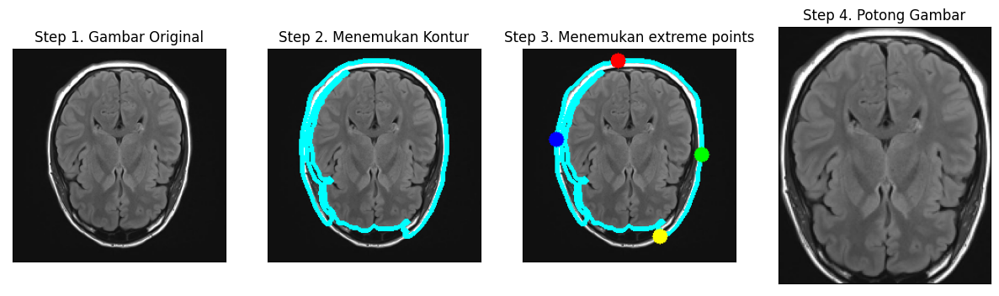

In [16]:
plt.figure(figsize=(15,6))
plt.subplot(141)
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.title('Step 1. Gambar Original')
plt.subplot(142)
plt.imshow(img_cnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 2. Menemukan Kontur')
plt.subplot(143)
plt.imshow(img_pnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 3. Menemukan extreme points')
plt.subplot(144)
plt.imshow(new_img)
plt.xticks([])
plt.yticks([])
plt.title('Step 4. Potong Gambar')
plt.show()

In [17]:
X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

/var/folders/ks/sfvwnhvj429_0mlztjrg16bh0000gn/T/ipykernel_1214/2254567846.py:31: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



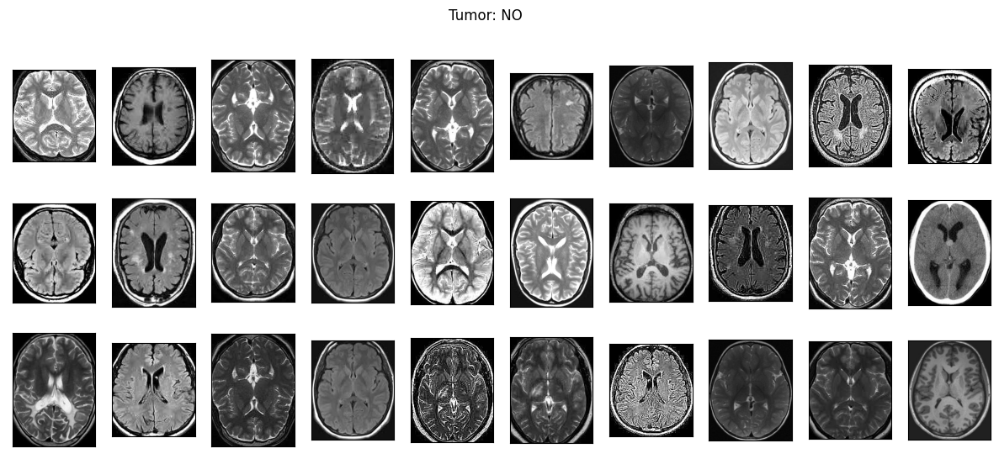

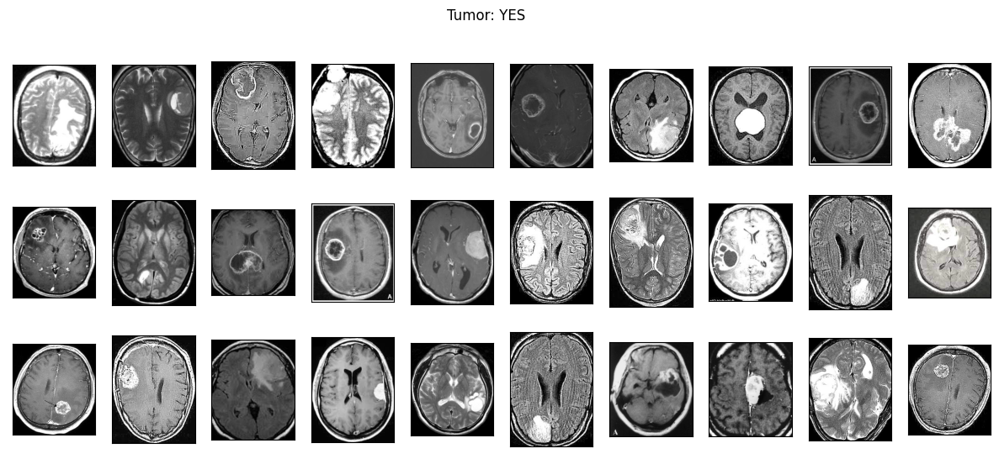

In [18]:
plot_samples(X_train_crop, y_train, labels, 30)

In [19]:
def save_new_images(x_set, y_set, folder_name):
    i = 0
    for (img, imclass) in zip(x_set, y_set):
        if imclass == 0:
            cv2.imwrite(folder_name+'NO/'+str(i)+'.jpg', img)
        else:
            cv2.imwrite(folder_name+'YES/'+str(i)+'.jpg', img)
        i += 1

In [20]:
!mkdir TRAIN_CROP TEST_CROP VAL_CROP TRAIN_CROP/YES TRAIN_CROP/NO TEST_CROP/YES TEST_CROP/NO VAL_CROP/YES VAL_CROP/NO

In [21]:
save_new_images(X_train_crop, y_train, folder_name='TRAIN_CROP/')
save_new_images(X_val_crop, y_val, folder_name='VAL_CROP/')
save_new_images(X_test_crop, y_test, folder_name='TEST_CROP/')

In [22]:
def preprocess_imgs(set_name, img_size):
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input(img))
    return np.array(set_new)

In [23]:
X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

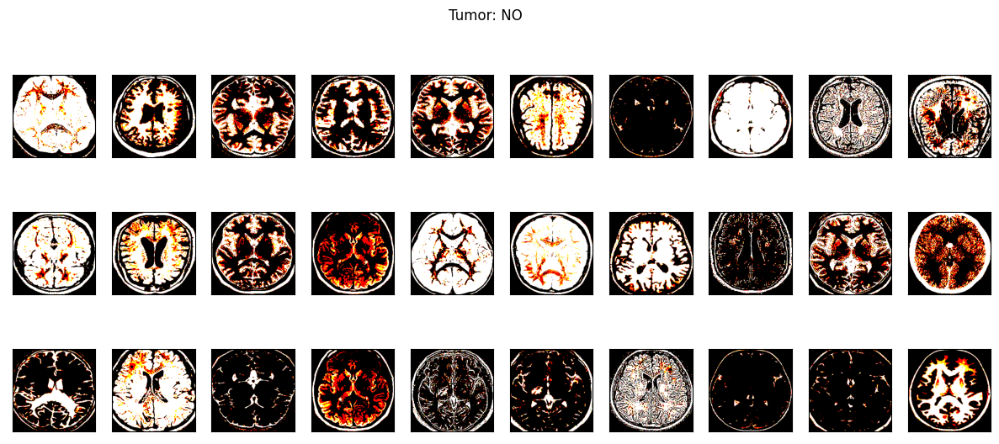

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

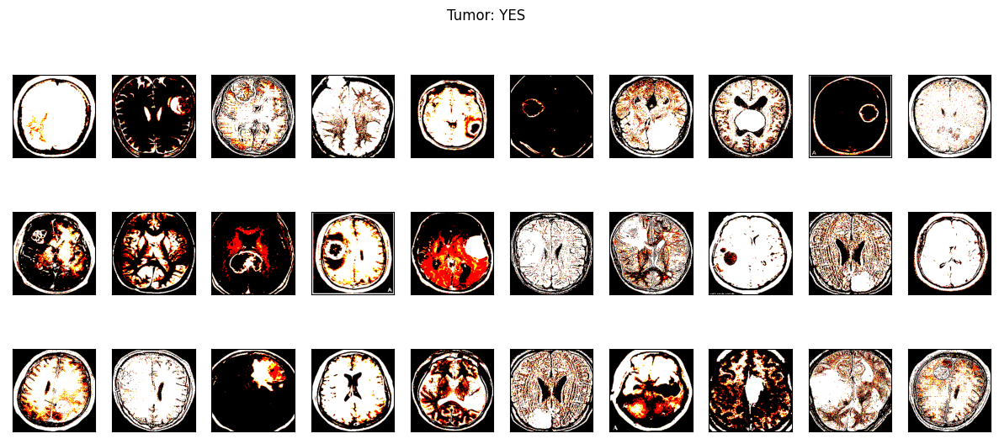

In [24]:
plot_samples(X_train_prep, y_train, labels, 30)

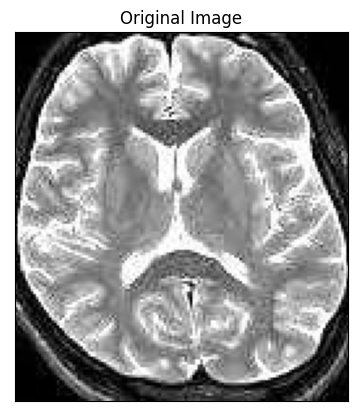

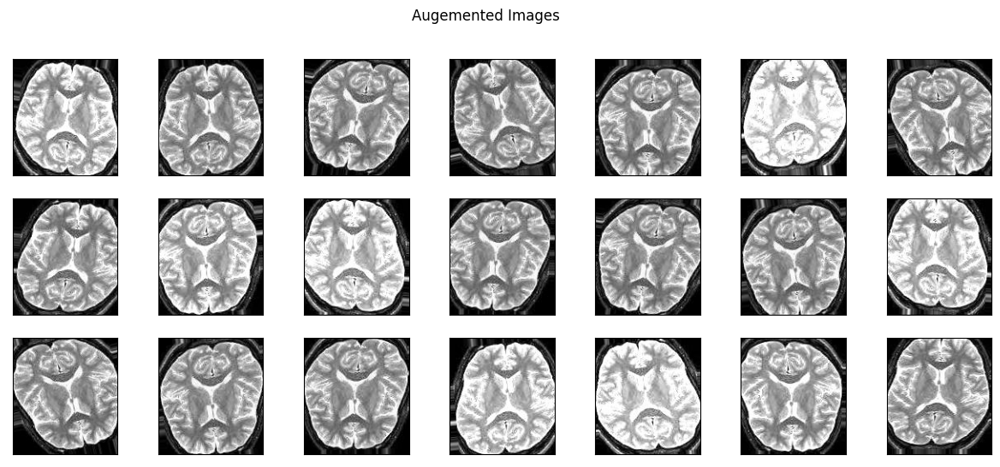

In [25]:
demo_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    rescale=1./255,
    shear_range=0.05,
    brightness_range=[0.1, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

os.mkdir('preview')
x = X_train_crop[0]  
x = x.reshape((1,) + x.shape) 

i = 0
for batch in demo_datagen.flow(x, batch_size=1, save_to_dir='preview', save_prefix='aug_img', save_format='jpg'):
    i += 1
    if i > 20:
        break 
        
plt.imshow(X_train_crop[0])
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

plt.figure(figsize=(15,6))
i = 1
for img in os.listdir('preview/'):
    img = cv2.imread('preview/' + img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3,7,i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    i += 1
    if i > 3*7:
        break
plt.suptitle('Augemented Images')
plt.show()

In [26]:
TRAIN_DIR = 'TRAIN_CROP/'
VAL_DIR = 'VAL_CROP/'
RANDOM_SEED = 42
train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)


train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)


validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

Found 1800 images belonging to 2 classes.
Found 600 images belonging to 2 classes.


In [30]:
#Callbacks
EPOCHS = 30
es = EarlyStopping(
    monitor='accuracy', 
    mode='max',
    patience=6
)

nClasses = 1

In [31]:
nClasses = 1
model_2 = Sequential()

model_2.add(Conv2D(16,(3,3),padding='same',input_shape =X_train_prep[0].shape))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2,2),strides=2,padding = 'same'))

model_2.add(Conv2D(32,(3,3),padding='same'))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size=(2,2),strides=2,padding = 'same'))

model_2.add(Flatten())
model_2.add(Dense(nClasses,activation='sigmoid'))
    
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 224, 224, 16)      448       
                                                                 
 batch_normalization_4 (Batc  (None, 224, 224, 16)     64        
 hNormalization)                                                 
                                                                 
 activation_4 (Activation)   (None, 224, 224, 16)      0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 112, 112, 16)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 batch_normalization_5 (Batc  (None, 112, 112, 32)    

In [32]:
model_2.compile(optimizer='adam',loss='binary_crossentropy', metrics=['accuracy','AUC'])

In [34]:
history = model_2.fit(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

Epoch 1/30
50/50 [==============================] - 88s 2s/step - loss: 5.9663 - accuracy: 0.5577 - auc: 0.5760 - val_loss: 2.6869 - val_accuracy: 0.5750 - val_auc: 0.5620
Epoch 2/30
50/50 [==============================] - 82s 2s/step - loss: 1.2962 - accuracy: 0.6237 - auc: 0.6731 - val_loss: 2.7899 - val_accuracy: 0.5450 - val_auc: 0.6633
Epoch 3/30
50/50 [==============================] - 79s 2s/step - loss: 1.2570 - accuracy: 0.6282 - auc: 0.6846 - val_loss: 3.5466 - val_accuracy: 0.5100 - val_auc: 0.6557
Epoch 4/30
50/50 [==============================] - 80s 2s/step - loss: 1.2405 - accuracy: 0.6561 - auc: 0.7220 - val_loss: 1.6294 - val_accuracy: 0.6075 - val_auc: 0.6625
Epoch 5/30
50/50 [==============================] - 79s 2s/step - loss: 1.3795 - accuracy: 0.6523 - auc: 0.7093 - val_loss: 1.5480 - val_accuracy: 0.6275 - val_auc: 0.8246
Epoch 6/30
50/50 [==============================] - 81s 2s/step - loss: 1.0708 - accuracy: 0.6637 - auc: 0.7282 - val_loss: 0.5789 - val_acc

In [35]:
model_2.save("custom_1.h5")
print("Model Berhasil di Simpan")

Model Berhasil di Simpan


In [36]:
model_history = history.history

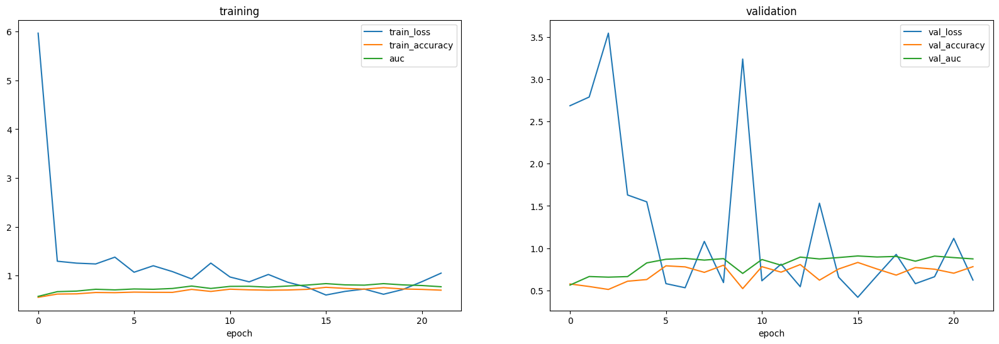

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20 , 6))
#plotting the training
plt.subplot(1, 2, 1)
plt.plot(model_history['loss'])
plt.plot(model_history['accuracy'])
plt.plot(model_history['auc'])
plt.title('training')
plt.xlabel('epoch')
plt.legend(['train_loss', 'train_accuracy' , 'auc'], loc='upper right')

#plotting the validation
plt.subplot(1, 2, 2)
plt.plot(model_history['val_loss'])
plt.plot(model_history['val_accuracy'])
plt.plot(model_history['val_auc'])
plt.title('validation')
plt.xlabel('epoch')
plt.legend(['val_loss', 'val_accuracy' , 'val_auc'], loc='upper right')
plt.show()

19/19 [==============================] - 7s 349ms/step
Train Accuracy = 0.80
Val Accuracy = 0.79
Test Accuracy = 0.76


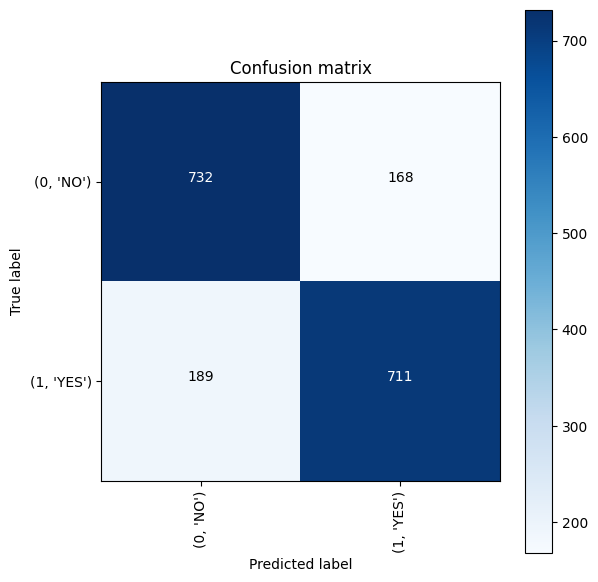

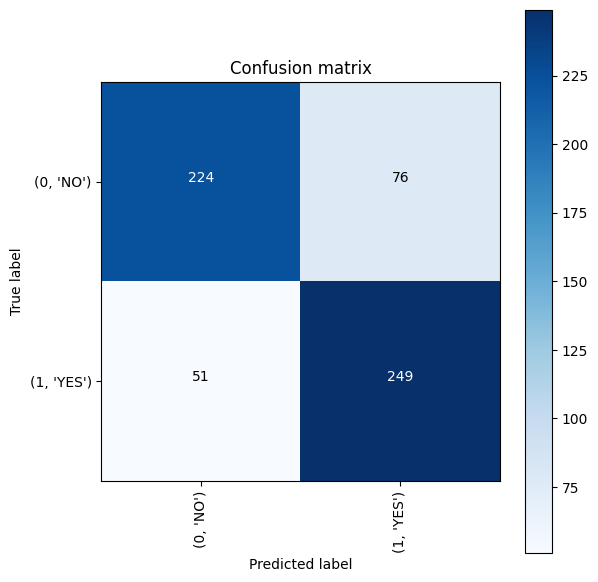

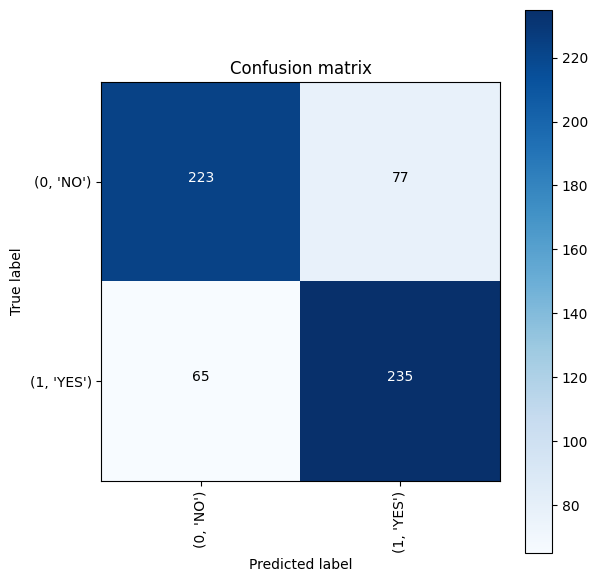

In [39]:
#get the train, test and validation accuracies
train_predictions = model_2.predict(X_train_prep)
val_predictions = model_2.predict(X_val_prep)
test_predictions = model_2.predict(X_test_prep)

#Binarizing all the outputs by setting the threshold to 0.5
train_predictions = [1 if x>0.5 else 0 for x in train_predictions]
val_predictions = [1 if x>0.5 else 0 for x in val_predictions]
test_predictions = [1 if x>0.5 else 0 for x in test_predictions]

#Calculating the accuracy scores
train_accuracy = accuracy_score(y_train, train_predictions)
val_accuracy = accuracy_score(y_val, val_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)
print('Train Accuracy = %.2f' % train_accuracy)
print('Val Accuracy = %.2f' % val_accuracy)
print('Test Accuracy = %.2f' % test_accuracy)

#Plotting the confusion matrix on the test data
confusion_mtx = confusion_matrix(y_train, train_predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = list(labels.items()), normalize=False)

confusion_mtx = confusion_matrix(y_val, val_predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = list(labels.items()), normalize=False)

confusion_mtx = confusion_matrix(y_test, test_predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = list(labels.items()), normalize=False)

In [40]:
test_prob_pred = model_2.predict(X_test_prep)

19/19 [==============================] - 7s 381ms/step


In [41]:
from sklearn import metrics
print('Accuracy score is :', metrics.accuracy_score(y_test, test_predictions))
print('Precision score is :', metrics.precision_score(y_test, test_predictions, average='weighted'))
print('Recall score is :', metrics.recall_score(y_test, test_predictions, average='weighted'))
print('F1 Score is :', metrics.f1_score(y_test, test_predictions, average='weighted'))
print('ROC AUC Score is :', metrics.roc_auc_score(y_test, test_prob_pred,multi_class='ovo', average='weighted'))
print('Cohen Kappa Score:', metrics.cohen_kappa_score(y_test, test_predictions))

print('\t\tClassification Report:\n', metrics.classification_report(y_test, test_predictions))

Accuracy score is : 0.7633333333333333
Precision score is : 0.7637553418803419
Recall score is : 0.7633333333333333
F1 Score is : 0.7632386287848473
ROC AUC Score is : 0.8721333333333333
Cohen Kappa Score: 0.5266666666666666
		Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.74      0.76       300
           1       0.75      0.78      0.77       300

    accuracy                           0.76       600
   macro avg       0.76      0.76      0.76       600
weighted avg       0.76      0.76      0.76       600



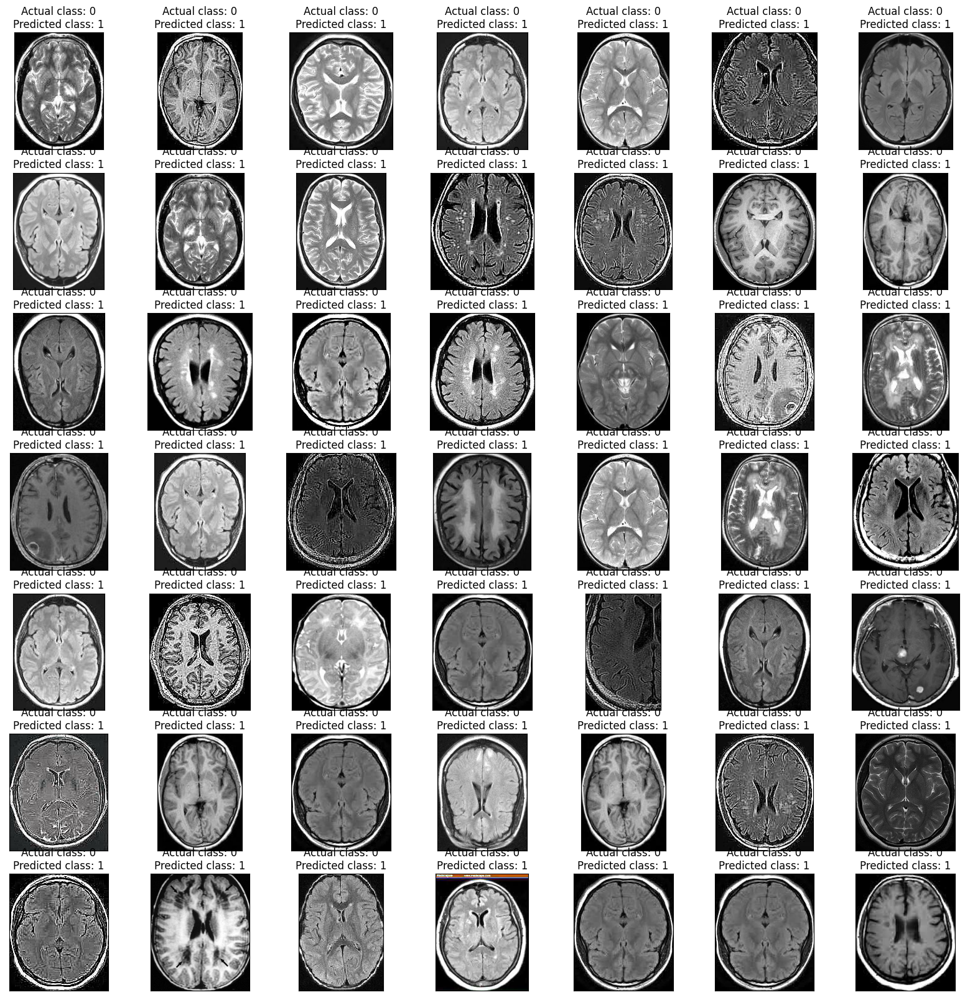

In [42]:
ind_list = np.argwhere((y_test == test_predictions) == False)[:, -1]

if ind_list.size == 0:
    print('There are no correctly classified images.')
else:
    
    fig, axes = plt.subplots(nrows=7,
                         ncols=7,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})
    for i, ax in enumerate(axes.flat):
        ax.imshow(X_test_crop[ind_list[i]])
        ax.set_title(f'Actual class: {y_val[ind_list[i]]}\nPredicted class: {test_predictions[ind_list[i]]}')
    plt.show()

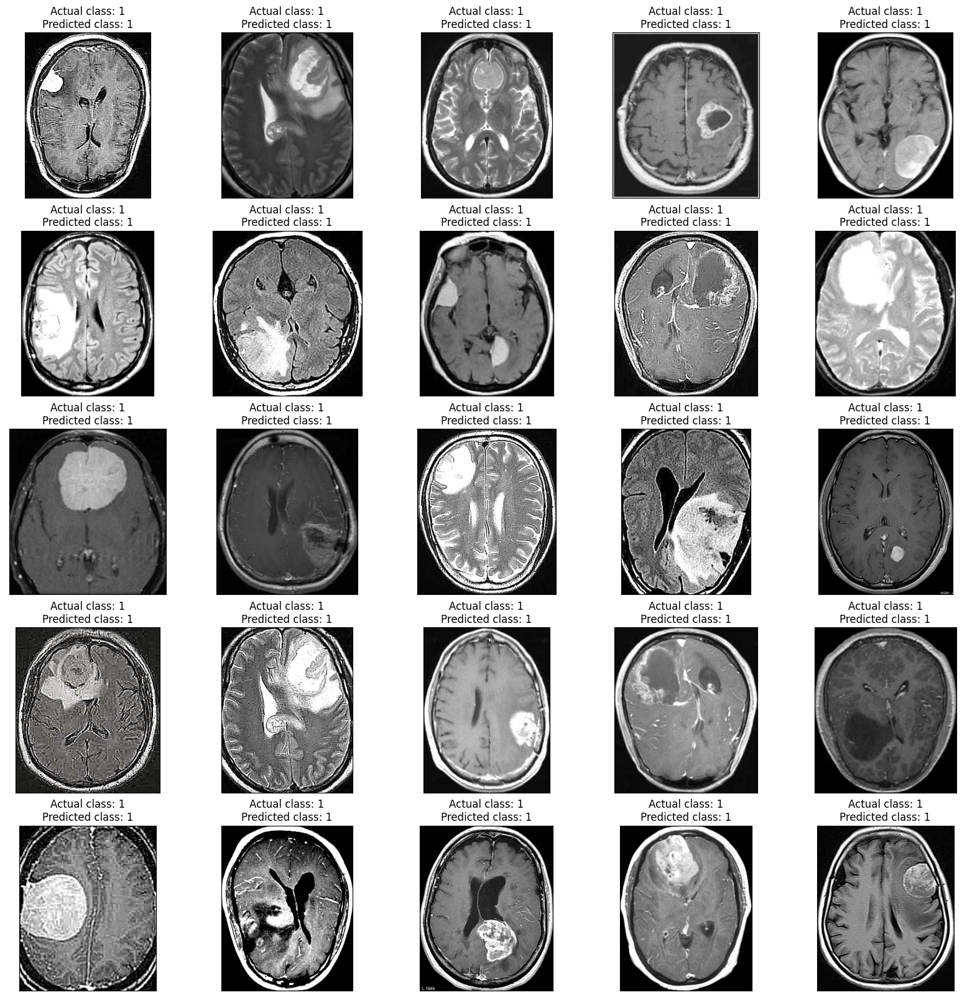

In [44]:
ind_list = np.argwhere((y_test == test_predictions) & (y_test == 1))[:, -1]

if ind_list.size == 0:
    print('There are no correctly classified images.')
else:
    
    fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})
    for i, ax in enumerate(axes.flat):
        ax.imshow(X_test_crop[ind_list[i]])
        ax.set_title(f'Actual class: {y_val[ind_list[i]]}\nPredicted class: {test_predictions[ind_list[i]]}')
    plt.show()

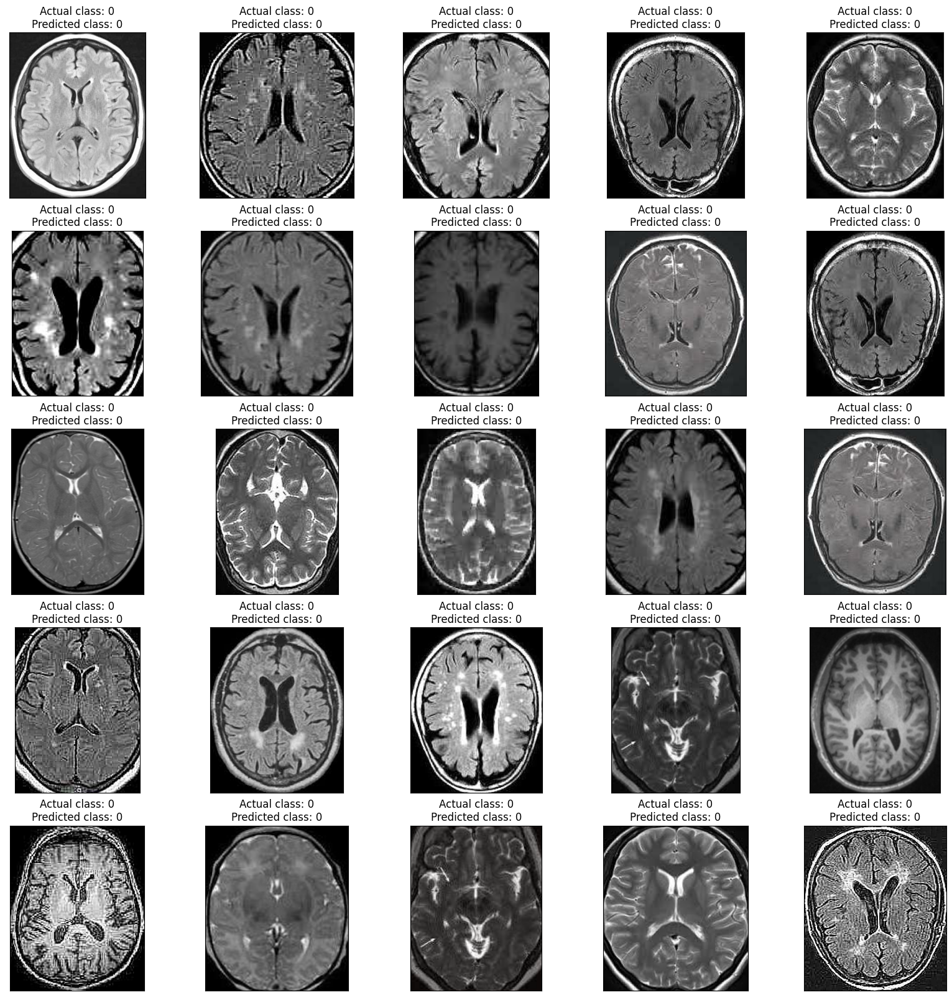

In [43]:
ind_list = np.argwhere((y_test == test_predictions) & (y_test == 0))[:, -1]

if ind_list.size == 0:
    print('There are no correctly classified images.')
else:
    
    fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})
    for i, ax in enumerate(axes.flat):
        ax.imshow(X_test_crop[ind_list[i]])
        ax.set_title(f'Actual class: {y_val[ind_list[i]]}\nPredicted class: {test_predictions[ind_list[i]]}')
    plt.show()

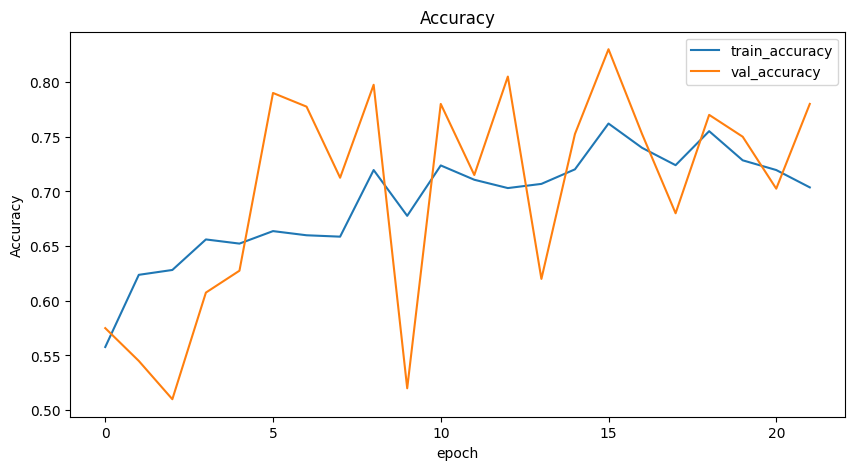

In [44]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10 , 5))
#plotting the training accuracy
plt.plot(history.history['accuracy'])
#plotting the validation accuracy
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy')
plt.xlabel('epoch')
plt.ylabel('Accuracy')
plt.legend(['train_accuracy' , 'val_accuracy'], loc='upper right')
plt.show()

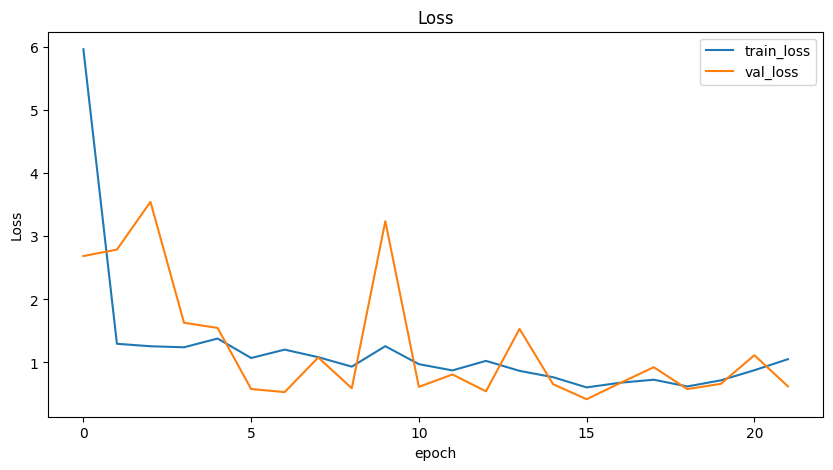

In [45]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10 , 5))
#plotting the training loss
plt.plot(history.history['loss'])
#plotting the validation loss
plt.plot(history.history['val_loss'])
plt.title('Loss')
plt.xlabel('epoch')
plt.ylabel('Loss')
plt.legend(['train_loss' , 'val_loss'], loc='upper right')
plt.show()

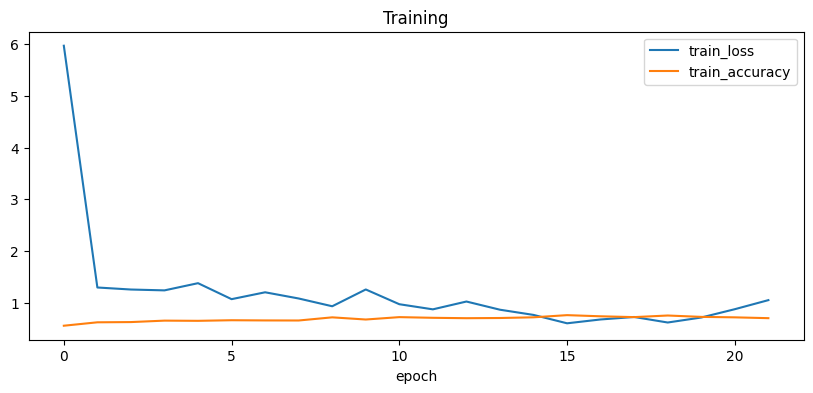

In [46]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10 , 4))
#plotting the training loss
plt.plot(history.history['loss'])
#plotting the training accuracy
plt.plot(history.history['accuracy'])
plt.title('Training')
plt.xlabel('epoch')
plt.legend(['train_loss', 'train_accuracy'], loc='upper right')
plt.show()